In [3]:
import cv2
import numpy as np
from PIL import Image
import queue
import matplotlib.pyplot as plt

def cv2_to_PIL(image):
    return Image.fromarray(image)

In [2]:
#let 0 be black (can't visit)
#let 1 be white (can visit)

#this is easy with regular images of mazes but need to test for user-taken maze images. 


In [7]:
user_image = cv2.imread('maze_images/user_images/user_maze_normal.jpg',0)

In [8]:
user_image_pil = cv2_to_PIL(user_image)

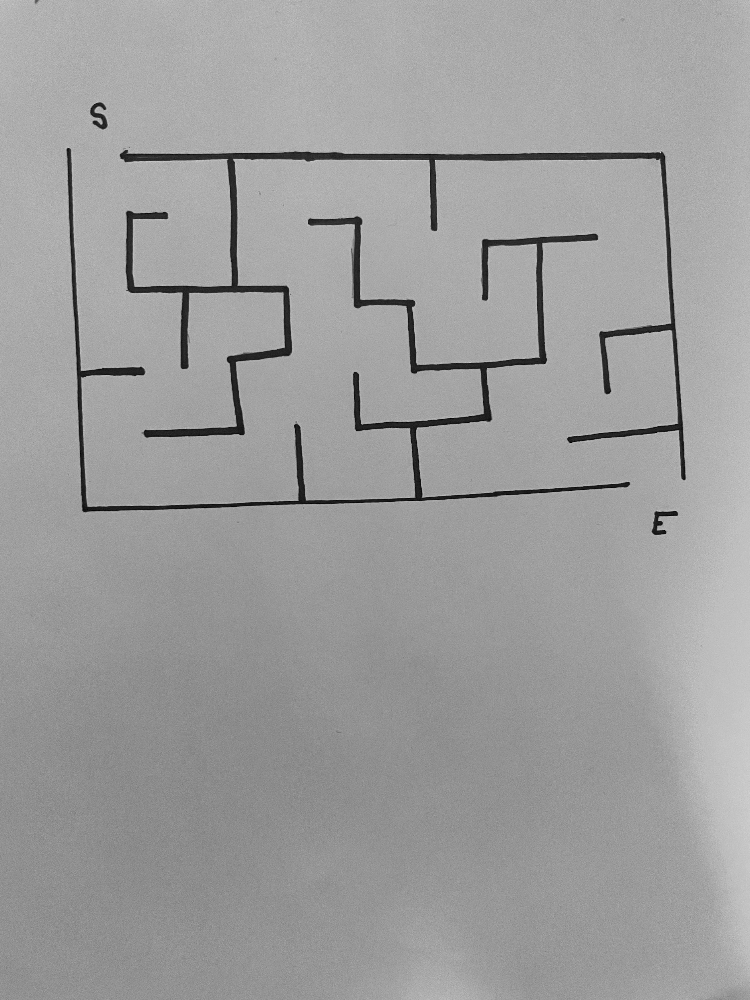

In [9]:
user_image_pil

In [10]:
img = cv2.medianBlur(user_image, 5)

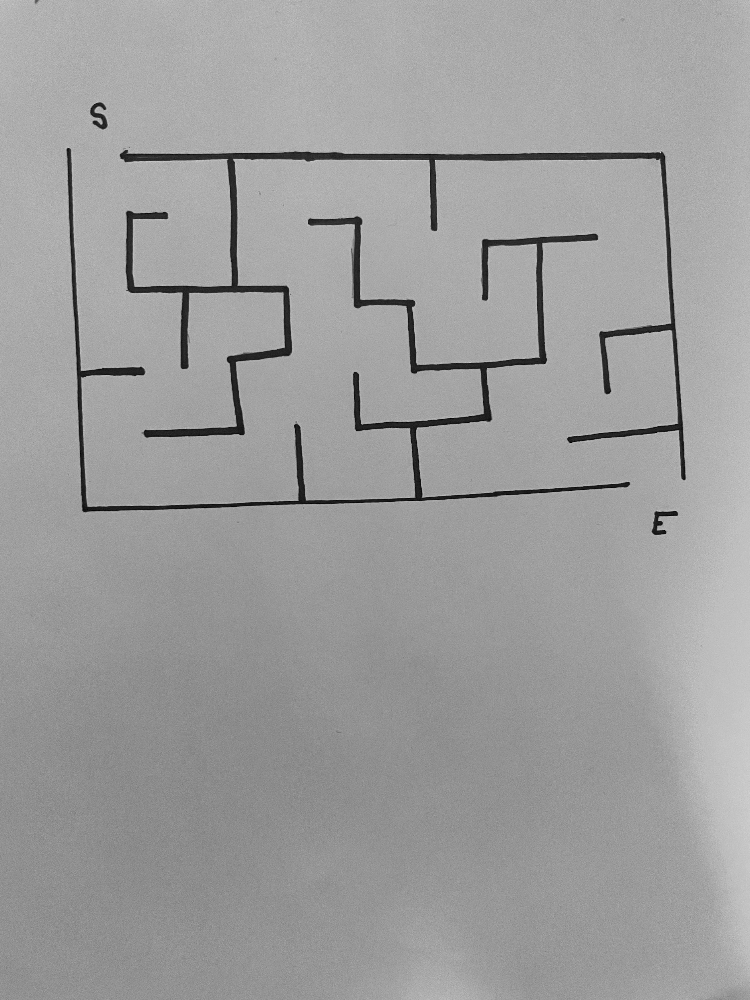

In [23]:
user_image_pil = cv2_to_PIL(user_image)
user_image_pil

In [14]:
ret, binary_default = cv2.threshold(user_image, 127, 255, cv2.THRESH_BINARY)

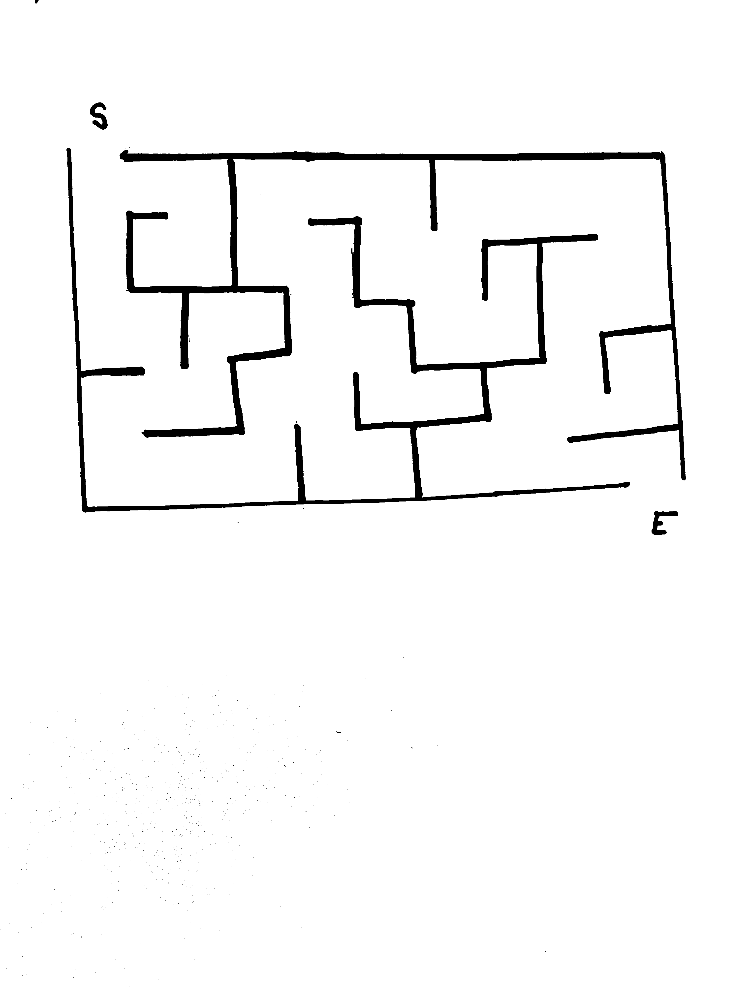

In [15]:
cv2_to_PIL(binary_default)

In [30]:
def regular_threshold(image_path: str):
    input_image = cv2.imread(image_path, 0)
    input_image = cv2.medianBlur(input_image, 5)
    ret, binary_output = cv2.threshold(input_image, 127, 255, cv2.THRESH_BINARY)
    return binary_output

In [31]:
user_images = ['maze_images/user_images/user_maze_bright.jpg',
               'maze_images/user_images/user_maze_exposed.jpg',
               'maze_images/user_images/user_maze_normal.jpg', 
               'maze_images/user_images/user_maze_shadow.jpg'
              ]


In [41]:
outputs = []

for image_path in user_images:
    cv2_binary = regular_threshold(image_path)
    outputs.append(cv2_to_PIL(cv2_binary))

### cells below show why basic binary thresholding was not going to work

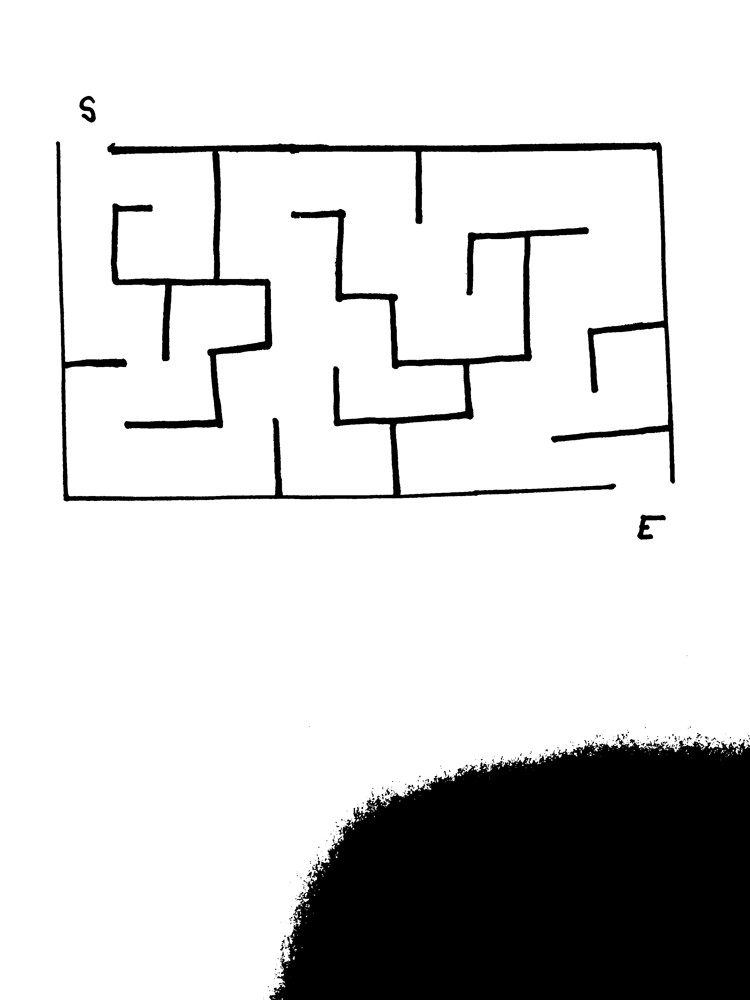

In [37]:
outputs[0]

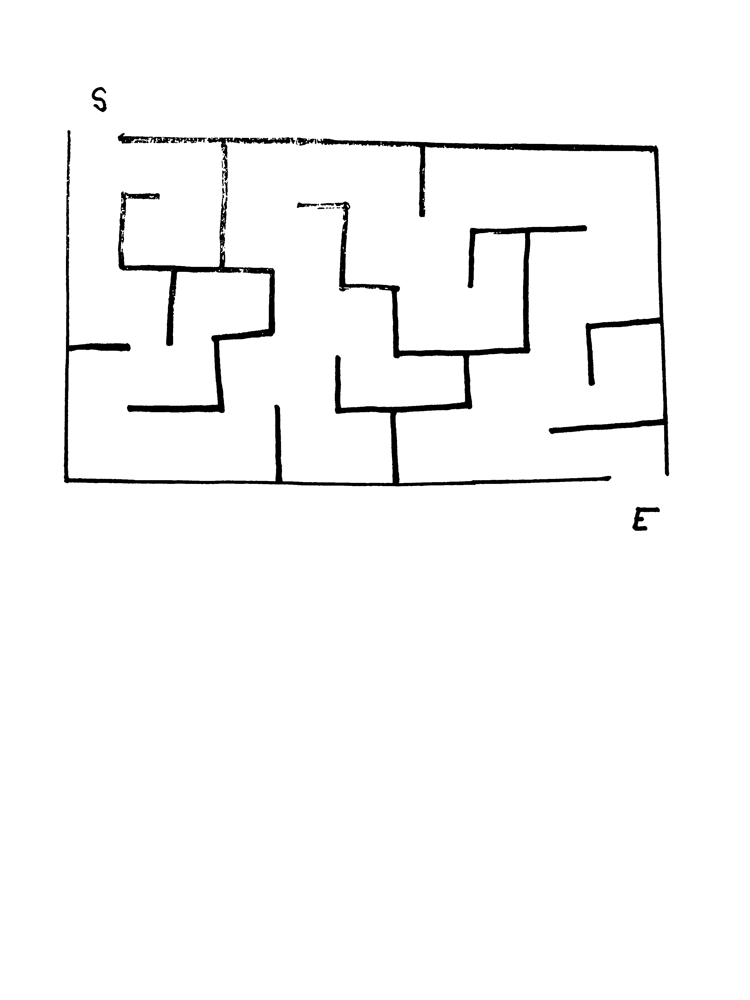

In [38]:
outputs[1]

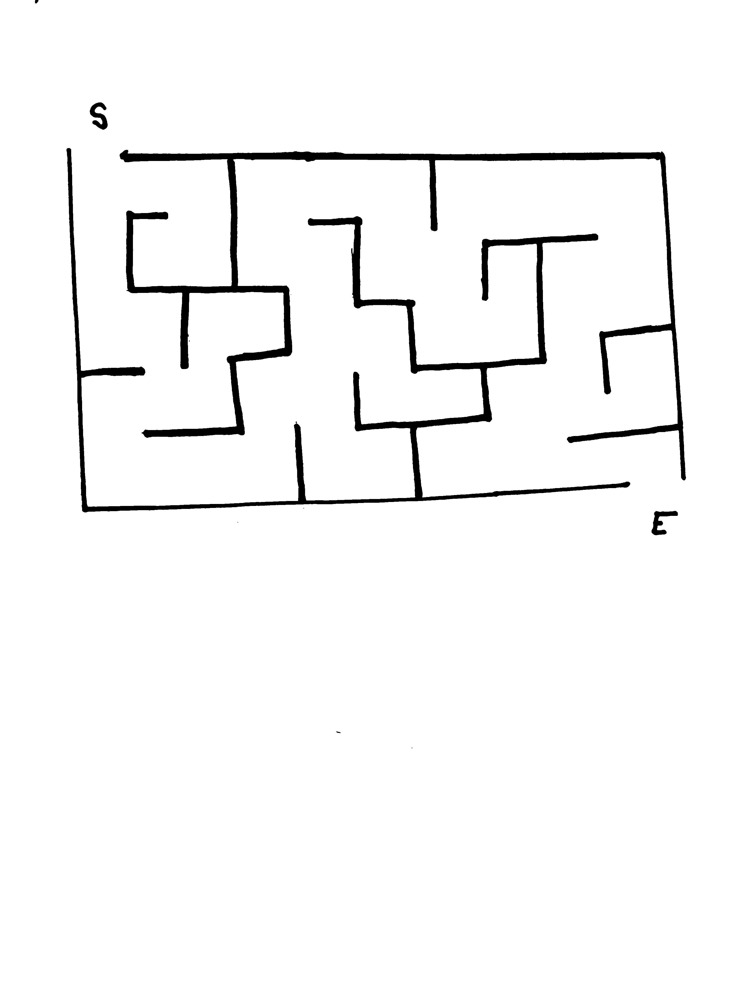

In [39]:
outputs[2]

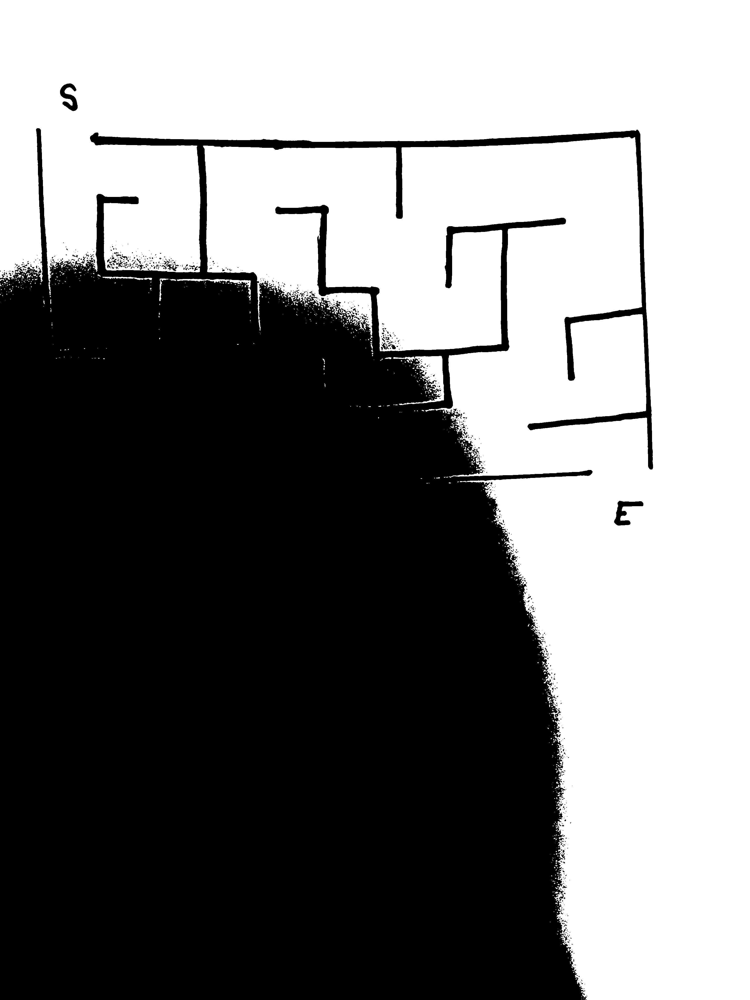

In [40]:
outputs[3]

### Try adaptive thresholding instead
https://docs.opencv.org/master/d7/d4d/tutorial_py_thresholding.html

In [46]:
def adaptive_mean_threshold(image_path: str):
    input_image = cv2.imread(image_path, 0)
    input_image = cv2.medianBlur(input_image, 5)
    output = cv2.adaptiveThreshold(input_image,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2)
    return output

In [49]:
outputs_mean = []

for image_path in user_images:
    cv2_binary = adaptive_mean_threshold(image_path)
    outputs_mean.append(cv2_to_PIL(cv2_binary))

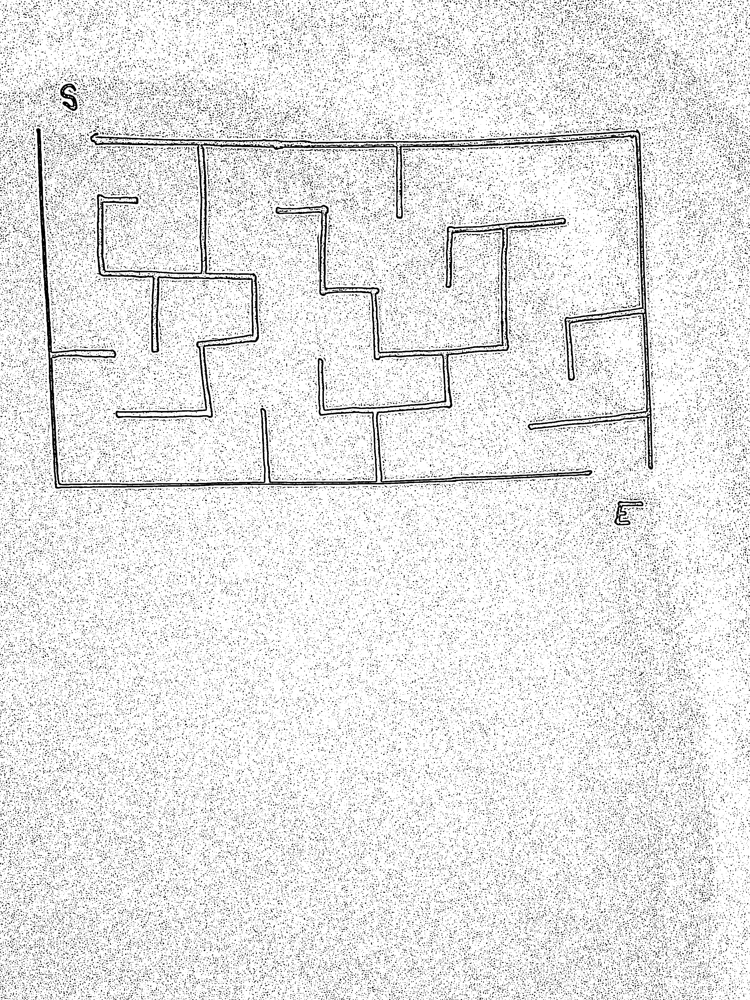

In [54]:
outputs_mean[3]

In [56]:
#try gaussian adaptive thresholding
def adaptive_gauss_threshold(image_path: str):
    input_image = cv2.imread(image_path, 0)
    input_image = cv2.medianBlur(input_image, 5)
    output = cv2.adaptiveThreshold(input_image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)
    return output


In [57]:
outputs_gauss = []

for image_path in user_images:
    cv2_binary = adaptive_gauss_threshold(image_path)
    outputs_gauss.append(cv2_to_PIL(cv2_binary))

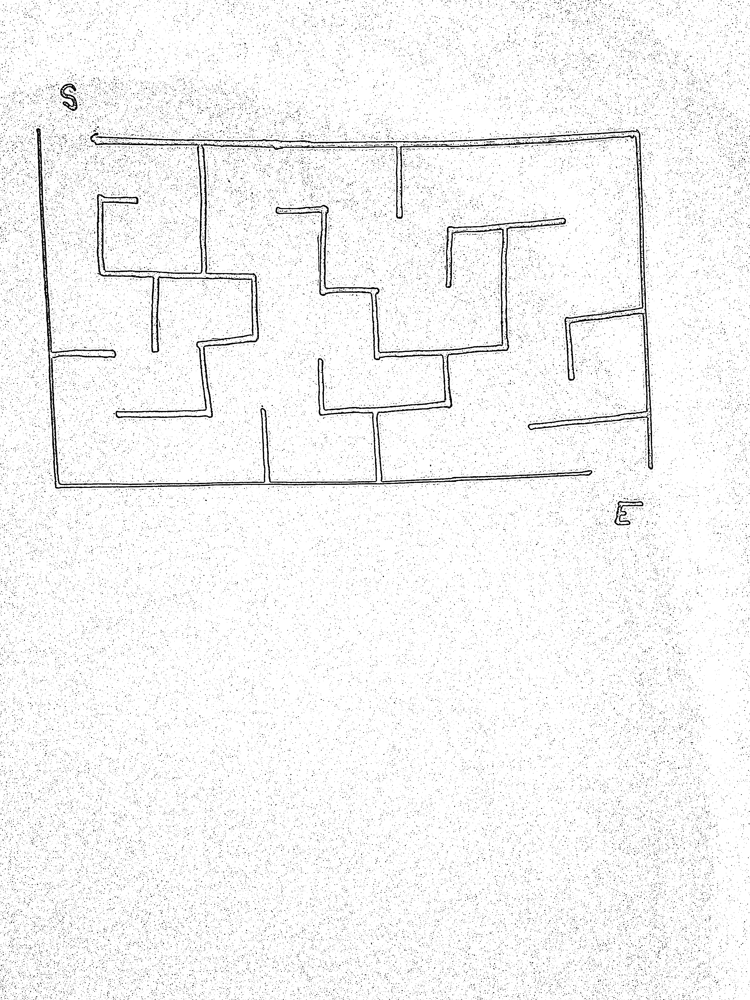

In [62]:
outputs_gauss[3]

In [76]:
#try otsu's binarization for thresholding
def adaptive_otsu_threshold(image_path: str):
    input_image = cv2.imread(image_path, 0)
    #input_image = cv2.medianBlur(input_image, 5)
    ret, output = cv2.threshold(input_image, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    return output

In [77]:
outputs_otsu = []

for image_path in user_images:
    cv2_binary = adaptive_otsu_threshold(image_path)
    outputs_otsu.append(cv2_to_PIL(cv2_binary))

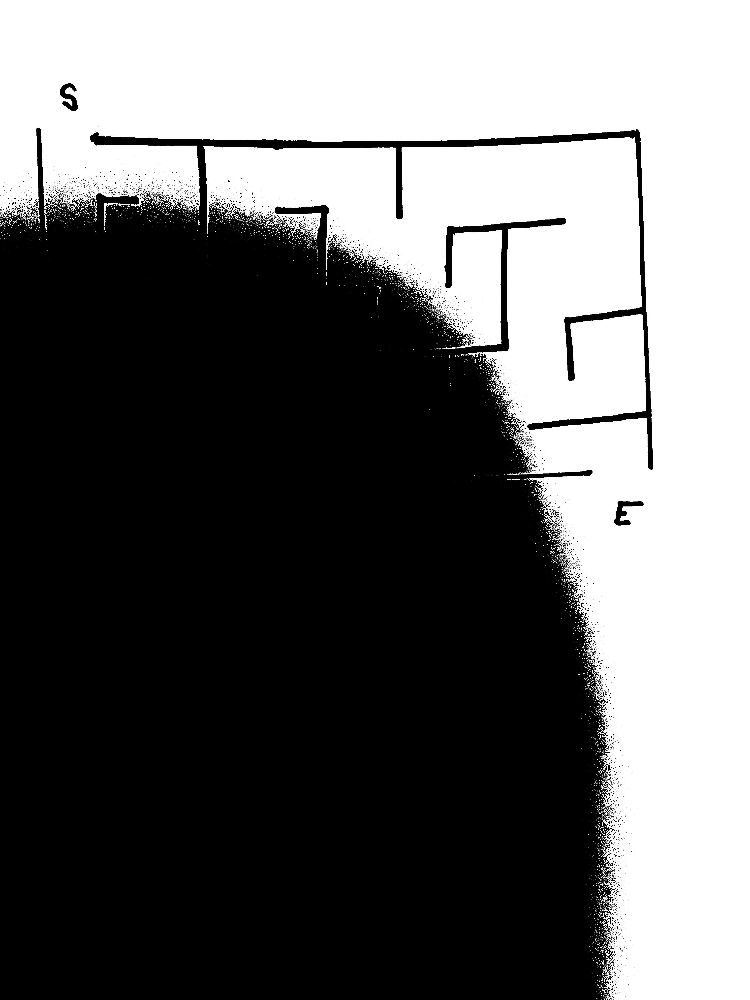

In [82]:
outputs_otsu[3]

In [85]:
#otsu thresholding after gaussian blur
def adaptive_gauss_otsu_threshold(image_path: str):
    input_image = cv2.imread(image_path, 0)
    blur = cv2.GaussianBlur(input_image,(5,5),0)
    ret, output = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    return output

In [88]:
outputs_gauss_otsu = []

for image_path in user_images:
    cv2_binary = adaptive_gauss_otsu_threshold(image_path)
    outputs_gauss_otsu.append(cv2_to_PIL(cv2_binary))

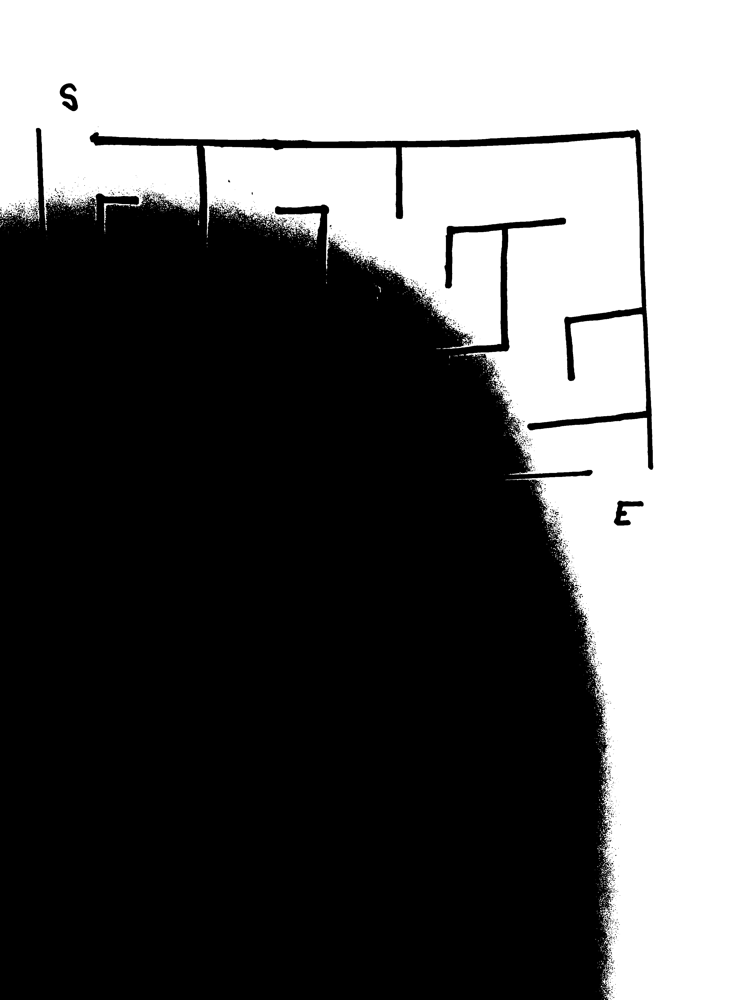

In [92]:
outputs_gauss_otsu[3]